# Assignment - S11 - CAMs, LRs and Optimizers on CIFAR10

Goals:
Use ResNet18 architecture for CIFAR 10 

1. Apply these transforms while training:
        RandomCrop(32, padding=4)
        CutOut(16x16)
        
2. Train resnet18 for 20 epochs on the CIFAR10 dataset

## Clone & Import Resnet and One Cycle Dependency

In [1]:
!git clone https://github.com/prarthanats/torch_wrapper.git

Cloning into 'torch_wrapper'...
remote: Enumerating objects: 27, done.
remote: Counting objects: 100% (27/27), done.
remote: Compressing objects: 100% (25/25), done.
remote: Total 27 (delta 3), reused 0 (delta 0), pack-reused 0
Receiving objects: 100% (27/27), 14.51 KiB | 14.51 MiB/s, done.
Resolving deltas: 100% (3/3), done.


## Install Dependencies 

In [2]:
!pip install albumentations
!pip install grad-cam
!pip install torchsummary
!pip install torch-lr-finder
!pip install torchview

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 46.4 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for grad-cam: filename=grad_cam-1.4.8-py3-none-any.whl size=38247 sha256=010497807f4a68a0eca9668f7a6eff967213ad0ccc9bf8e25f29db311e80fa55
  Stored in directory: /root/.cache/pip/wheels/f8/04/36/94ff3c8a4215826a21946b34c01180817e606989fdf53f7cd6
Successfully built grad-cam


# Import Dependencies 

In [3]:
from __future__ import print_function
import torchvision
import torch
from torchview import draw_graph
import graphviz
import torchvision
from pprint import pprint
%matplotlib inline
import matplotlib.pyplot as plt

## Import Custom Util Dependencies 

In [4]:
## Import Custom Libraries
from torch_wrapper.main import TriggerTraining
from torch_wrapper.utils import helper,data_augmentation,data_handeling,visulaization
from torch_wrapper.model import resnet
from torch_wrapper.utils.gradcam import generate_gradcam,plot_gradcam

/usr/local/lib/python3.10/dist-packages/torch_lr_finder/lr_finder.py:5: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


# Import Configs and Set the GPU

In [5]:
config = helper.process_config("/content/torch_wrapper/config/assignment_11.yaml")
use_cuda = torch.cuda.is_available()
helper.set_seed(config['model_params']['seed'],use_cuda)
device = torch.device("cuda" if use_cuda else "cpu")
pprint(config)

 loading Configuration of your experiment ..
{'criterion': 'CrossEntropyLoss',
 'data_augmentation': {'data_augment': None,
                       'grayscaleProb': 0.15,
                       'height': 32,
                       'horizontalFlipProb': 0.2,
                       'max_h_size': 8,
                       'max_w_size': 8,
                       'minHeight': 36,
                       'minWidth': 36,
                       'num_holes': 1,
                       'type': 'CIFAR10Albumentation',
                       'width': 32},
 'data_loader': {'args': {'batch_size': 512,
                          'num_workers': 2,
                          'pin_memory': True},
                 'classes': ['plane',
                             'car',
                             'bird',
                             'cat',
                             'deer',
                             'dog',
                             'frog',
                             'horse',
                      

## Create an instance for training and load the training data

In [6]:
exp_metrics={}
experiment_name=config['model_params']['experiment_name']
trigger_training=TriggerTraining(config)

In [7]:
classes= config['data_loader']['classes']
train_loader,test_loader = trigger_training.dataloader()

100%|██████████| 170498071/170498071 [00:02<00:00, 80026170.43it/s]


Extracting ./data/cifar-10-python.tar.gz to ./data


/usr/local/lib/python3.10/dist-packages/albumentations/augmentations/dropout/cutout.py:50: FutureWarning: Cutout has been deprecated. Please use CoarseDropout
  warnings.warn(


Files already downloaded and verified


## Model Summary for Resnet18

In [8]:
model = resnet.ResNet18()
model.to(device)
trigger_training.model_summary(model,(3,32,32))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 32, 32]           1,728
       BatchNorm2d-2           [-1, 64, 32, 32]             128
            Conv2d-3           [-1, 64, 32, 32]          36,864
       BatchNorm2d-4           [-1, 64, 32, 32]             128
            Conv2d-5           [-1, 64, 32, 32]          36,864
       BatchNorm2d-6           [-1, 64, 32, 32]             128
        BasicBlock-7           [-1, 64, 32, 32]               0
            Conv2d-8           [-1, 64, 32, 32]          36,864
       BatchNorm2d-9           [-1, 64, 32, 32]             128
           Conv2d-10           [-1, 64, 32, 32]          36,864
      BatchNorm2d-11           [-1, 64, 32, 32]             128
       BasicBlock-12           [-1, 64, 32, 32]               0
           Conv2d-13          [-1, 128, 16, 16]          73,728
      BatchNorm2d-14          [-1, 128,

## Find the Best Learning Rate

  0%|          | 0/100 [00:00<?, ?it/s]

Stopping early, the loss has diverged
Learning rate search finished. See the graph with {finder_name}.plot()
LR suggestion: steepest gradient
Suggested LR: 3.51E-02


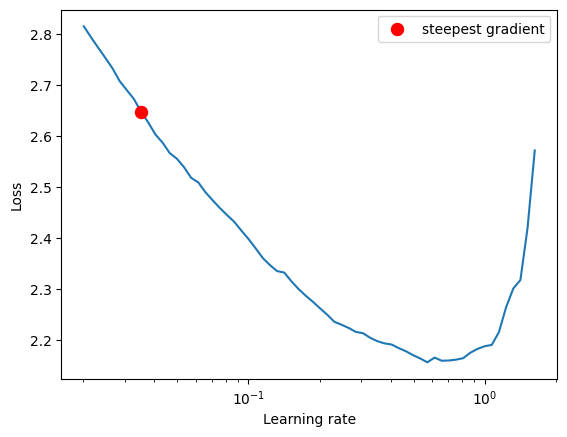

LRMAX: 0.035111917342151314


In [9]:
lrmax = trigger_training.learning_finder(model,train_loader)

## Trigger training

In [10]:
(exp_metrics[experiment_name]) = trigger_training.run_training(model,train_loader,test_loader,lrmax)

Epoch 1:


Loss=1.5638378858566284 Batch_id=97 LR=0.00464 Accuracy=35.93: 100%|██████████| 98/98 [00:41<00:00,  2.37it/s]



Test set: Average loss: 0.0036, Accuracy: 3916/10000 (39.16%)

Epoch 2:


Loss=1.4184805154800415 Batch_id=97 LR=0.01309 Accuracy=49.66: 100%|██████████| 98/98 [00:42<00:00,  2.33it/s]



Test set: Average loss: 0.0045, Accuracy: 4029/10000 (40.29%)

Epoch 3:


Loss=1.1353524923324585 Batch_id=97 LR=0.02353 Accuracy=58.18: 100%|██████████| 98/98 [00:41<00:00,  2.34it/s]



Test set: Average loss: 0.0036, Accuracy: 5029/10000 (50.29%)

Epoch 4:


Loss=0.9001946449279785 Batch_id=97 LR=0.03194 Accuracy=65.84: 100%|██████████| 98/98 [00:41<00:00,  2.34it/s]



Test set: Average loss: 0.0016, Accuracy: 7170/10000 (71.70%)

Epoch 5:


Loss=0.8339181542396545 Batch_id=97 LR=0.03511 Accuracy=71.57: 100%|██████████| 98/98 [00:41<00:00,  2.34it/s]



Test set: Average loss: 0.0016, Accuracy: 7339/10000 (73.39%)

Epoch 6:


Loss=0.7122399806976318 Batch_id=97 LR=0.03472 Accuracy=75.86: 100%|██████████| 98/98 [00:42<00:00,  2.33it/s]



Test set: Average loss: 0.0013, Accuracy: 7720/10000 (77.20%)

Epoch 7:


Loss=0.6160628199577332 Batch_id=97 LR=0.03358 Accuracy=78.90: 100%|██████████| 98/98 [00:41<00:00,  2.34it/s]



Test set: Average loss: 0.0018, Accuracy: 7401/10000 (74.01%)

Epoch 8:


Loss=0.4498029351234436 Batch_id=97 LR=0.03174 Accuracy=81.35: 100%|██████████| 98/98 [00:41<00:00,  2.34it/s]



Test set: Average loss: 0.0010, Accuracy: 8250/10000 (82.50%)

Epoch 9:


Loss=0.5891032218933105 Batch_id=97 LR=0.02928 Accuracy=83.49: 100%|██████████| 98/98 [00:41<00:00,  2.34it/s]



Test set: Average loss: 0.0011, Accuracy: 8218/10000 (82.18%)

Epoch 10:


Loss=0.3976404070854187 Batch_id=97 LR=0.02630 Accuracy=85.02: 100%|██████████| 98/98 [00:41<00:00,  2.34it/s]



Test set: Average loss: 0.0009, Accuracy: 8540/10000 (85.40%)

Epoch 11:


Loss=0.36522236466407776 Batch_id=97 LR=0.02295 Accuracy=87.00: 100%|██████████| 98/98 [00:41<00:00,  2.34it/s]



Test set: Average loss: 0.0008, Accuracy: 8606/10000 (86.06%)

Epoch 12:


Loss=0.3309040069580078 Batch_id=97 LR=0.01935 Accuracy=88.17: 100%|██████████| 98/98 [00:41<00:00,  2.34it/s]



Test set: Average loss: 0.0009, Accuracy: 8609/10000 (86.09%)

Epoch 13:


Loss=0.3672555387020111 Batch_id=97 LR=0.01568 Accuracy=89.78: 100%|██████████| 98/98 [00:41<00:00,  2.34it/s]



Test set: Average loss: 0.0008, Accuracy: 8799/10000 (87.99%)

Epoch 14:


Loss=0.24744948744773865 Batch_id=97 LR=0.01210 Accuracy=90.92: 100%|██████████| 98/98 [00:42<00:00,  2.33it/s]



Test set: Average loss: 0.0007, Accuracy: 8924/10000 (89.24%)

Epoch 15:


Loss=0.21767078340053558 Batch_id=97 LR=0.00875 Accuracy=92.20: 100%|██████████| 98/98 [00:41<00:00,  2.34it/s]



Test set: Average loss: 0.0007, Accuracy: 8970/10000 (89.70%)

Epoch 16:


Loss=0.20082253217697144 Batch_id=97 LR=0.00578 Accuracy=93.40: 100%|██████████| 98/98 [00:41<00:00,  2.34it/s]



Test set: Average loss: 0.0006, Accuracy: 9076/10000 (90.76%)

Epoch 17:


Loss=0.12145695090293884 Batch_id=97 LR=0.00333 Accuracy=94.75: 100%|██████████| 98/98 [00:41<00:00,  2.34it/s]



Test set: Average loss: 0.0006, Accuracy: 9117/10000 (91.17%)

Epoch 18:


Loss=0.13016997277736664 Batch_id=97 LR=0.00150 Accuracy=95.48: 100%|██████████| 98/98 [00:42<00:00,  2.33it/s]



Test set: Average loss: 0.0006, Accuracy: 9123/10000 (91.23%)

Epoch 19:


Loss=0.0886826142668724 Batch_id=97 LR=0.00038 Accuracy=95.89: 100%|██████████| 98/98 [00:41<00:00,  2.34it/s]



Test set: Average loss: 0.0006, Accuracy: 9150/10000 (91.50%)

Epoch 20:


Loss=0.12358154356479645 Batch_id=97 LR=0.00000 Accuracy=96.17: 100%|██████████| 98/98 [00:41<00:00,  2.34it/s]



Test set: Average loss: 0.0006, Accuracy: 9151/10000 (91.51%)



## Get Misclassified

Total wrong predictions are 849
Files already downloaded and verified


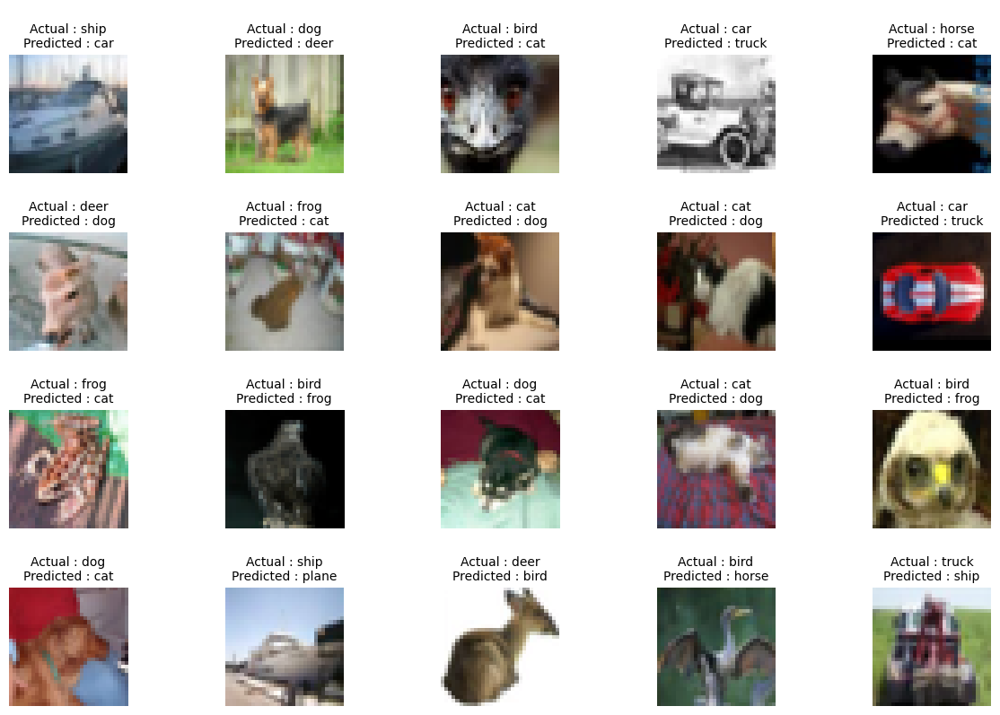

In [11]:
misclassified_images = trigger_training.wrong_predictions(model,test_loader,20)

# Get Class Level Accuracy

In [12]:
helper.class_level_accuracy(model, test_loader, device, classes)

Accuracy of plane : 93 %
Accuracy of   car : 96 %
Accuracy of  bird : 87 %
Accuracy of   cat : 82 %
Accuracy of  deer : 92 %
Accuracy of   dog : 85 %
Accuracy of  frog : 93 %
Accuracy of horse : 94 %
Accuracy of  ship : 94 %
Accuracy of truck : 95 %


# GradCam output for layer2, layer3 and layer4

torch.Size([10, 10])
Generating Grad-CAM @layer2
Generating Grad-CAM @layer3
Generating Grad-CAM @layer3


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


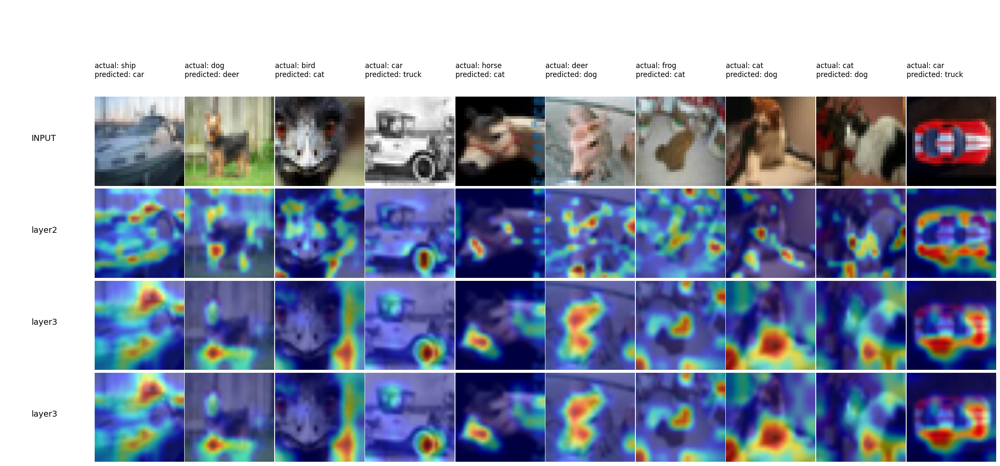

In [13]:
target_layers = ["layer2","layer3","layer3"]
gradcam_output, probs, predicted_classes = generate_gradcam(misclassified_images[:10], model, target_layers,device)
plot_gradcam(gradcam_output, target_layers, classes, (3, 32, 32),predicted_classes, misclassified_images[:10])

## Tensor Board Run

In [14]:
%load_ext tensorboard
%tensorboard --logdir=runs

<IPython.core.display.Javascript object>

## Plot Metrics

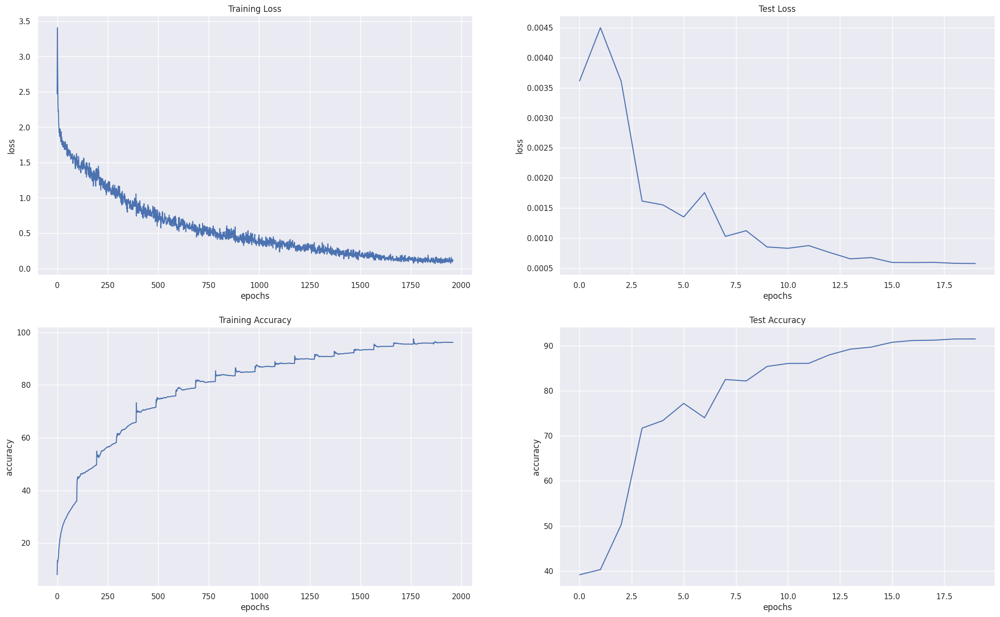

In [15]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def plot_metrics(exp_metrics):
    sns.set(font_scale=1)
    fig, axs = plt.subplots(2,2,figsize=(25,15))
    plt.rcParams["figure.figsize"] = (25,6)
    plot_train_acc,train_accuracy,train_losses,test_accuracy,test_losses  = exp_metrics


    axs[0, 0].set_title("Training Loss")
    axs[1, 0].set_title("Training Accuracy")
    axs[0, 1].set_title("Test Loss")
    axs[1, 1].set_title("Test Accuracy")

    axs[0, 0].plot(train_losses, label="Training Loss")
    axs[0,0].set_xlabel('epochs')
    axs[0,0].set_ylabel('loss')

    axs[1, 0].plot(train_accuracy, label="Training Accuracy")
    axs[1,0].set_xlabel('epochs')
    axs[1,0].set_ylabel('accuracy')

    axs[0, 1].plot(test_losses, label="Validation Loss")
    axs[0,1].set_xlabel('epochs')
    axs[0,1].set_ylabel('loss')

    axs[1, 1].plot(test_accuracy, label="Validation Accuracy")
    axs[1,1].set_xlabel('epochs')
    axs[1,1].set_ylabel('accuracy')

plot_metrics(exp_metrics[experiment_name])

## Visulaize Graph

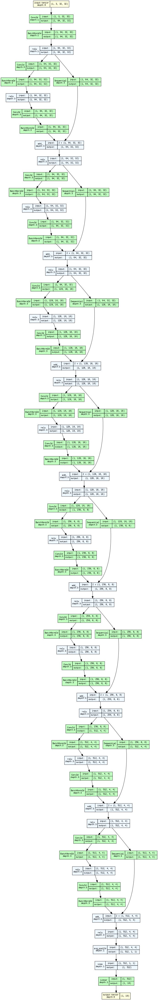

In [16]:
graphviz.set_jupyter_format('png')
model_graph = draw_graph(resnet.ResNet18(), input_size=(1,3,32,32), expand_nested=False)
model_graph.visual_graph